# 2022. 02. 03.

In [1]:
from mcbj import *
from tqdm.notebook import tqdm
import filter_traces
import plots
import pandas as pd

date = "22_02_03"
sample_rate = 50_000
home_folder = Path(f"D:/BJ_Data/{date}")
import numpy as np
from matplotlib.ticker import MultipleLocator

import warnings
warnings.filterwarnings('ignore')

# Summary

## Clean measurements



## Molecular measurements

At trace 61501, 5 s evaporation of BPY

After the evaporation, no sign of BPY
Evaporation repeated at trace 62134 \& 63301, but no molecular histogram

# Technical info

## Details:

Room temperature measurement in vacuum using the MCBJ (UFO) setup and mechanically fixed sample holder.

**IV**: Femto 1e7

## Calibration:

|                     |                     |
|:-------------------:|:-------------------:|
| $V_{\text{offset}}$ | $0.00126\;\mathrm{V}$ |
| $R_{\text{serial}}$ | $100\;k\Omega$     |
| $I_{\text{offset}}$ | $79.2798\;\text{pA}$|

# Statistics for the first 20200 traces

**BJ Settings:**

|                   |           |
|-------------------|:-----------:|
| rate              |  $5$        |
| pull excursion    | $5$         |
| push excursion    | $5$         |
| $G_{\text{low}}$  | $10^{-5}$ |
| $G_{\text{high}}$ | $10$      |

**1D histograms**: 100 bins per decade

**2D histograms**: 250 bins along horizontal and 400 bins along vertical axis, aligned at $10^{-5}\;G_0$ first and then also at $0.5\;G_0$

In [3]:
hist_1 = Histogram(home_folder, start_trace=301, end_trace=3132)

hist_1.calc_stats(align_at=1e-5, range_pull=(-1, 0.1), range_push=(-3, 1), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/29 [00:00<?, ?it/s]

Pull 2D histogram created from 2823 traces
Push 2D histogram created from 2818 traces


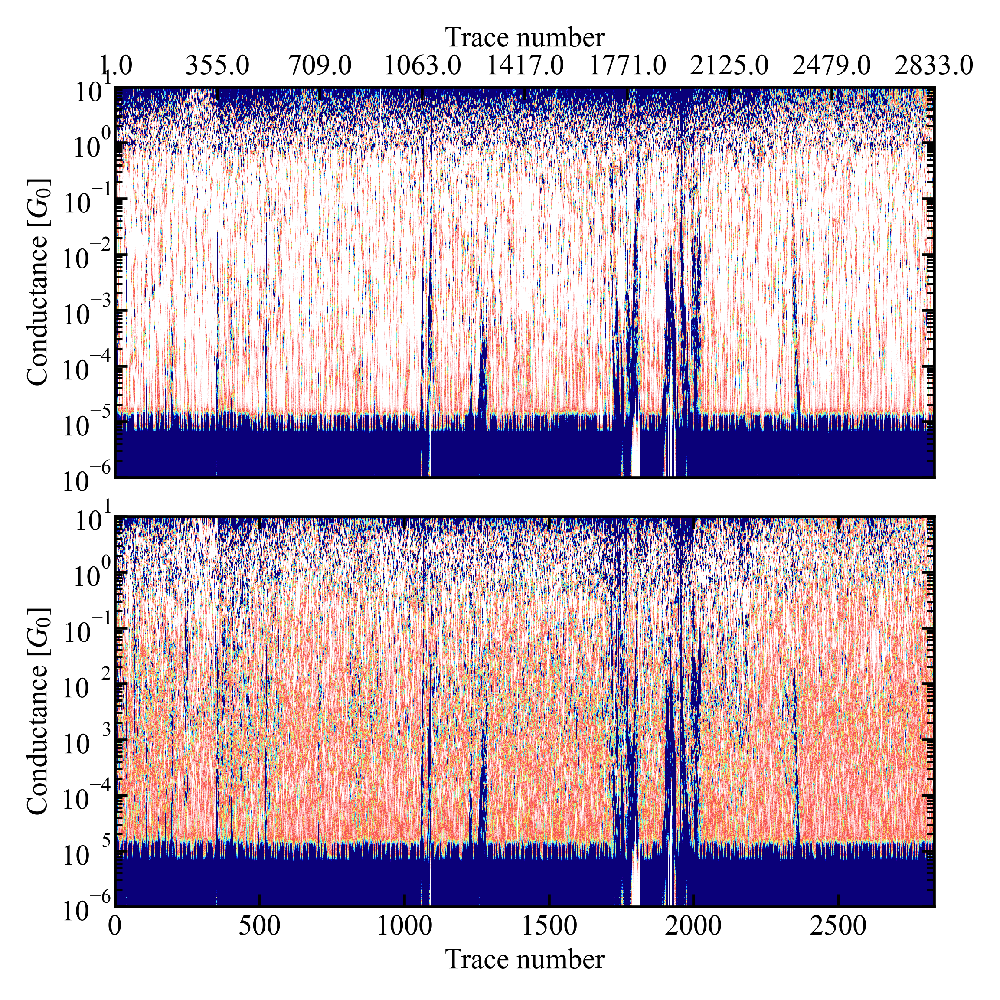

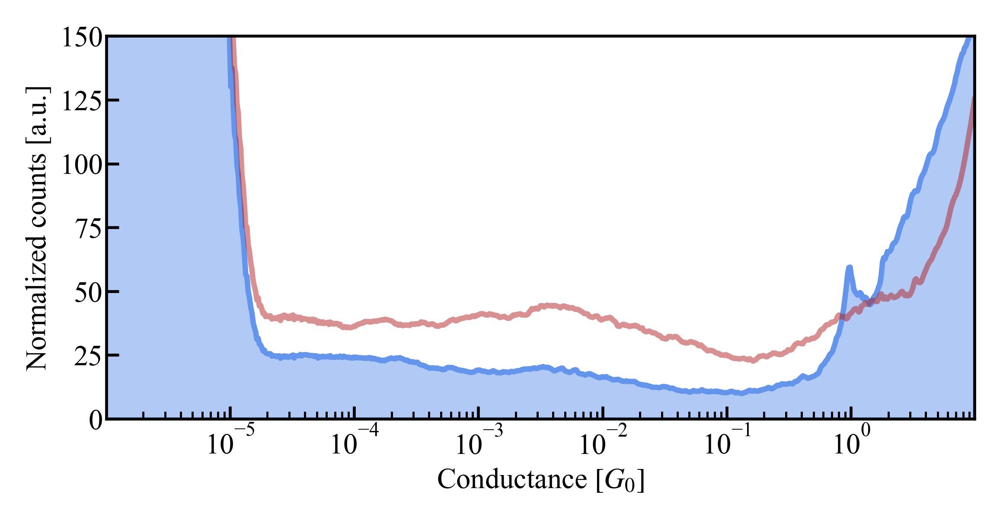

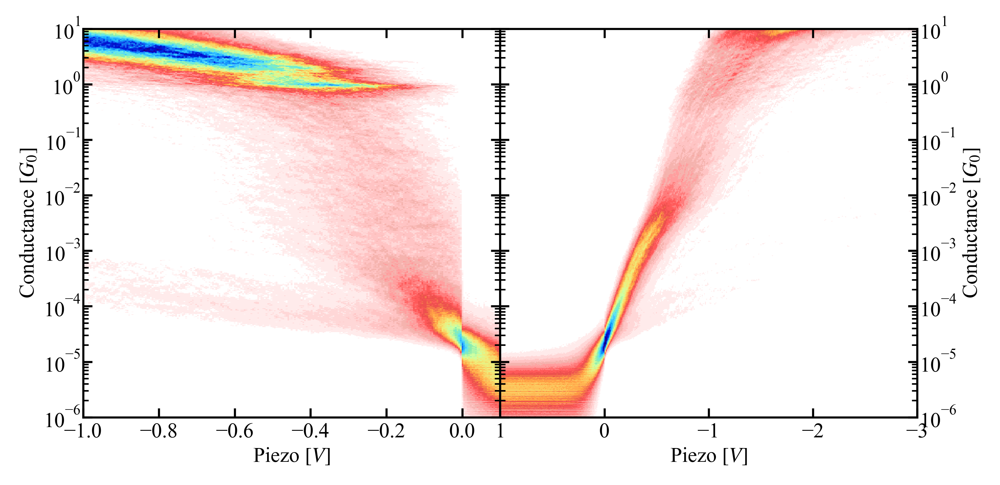

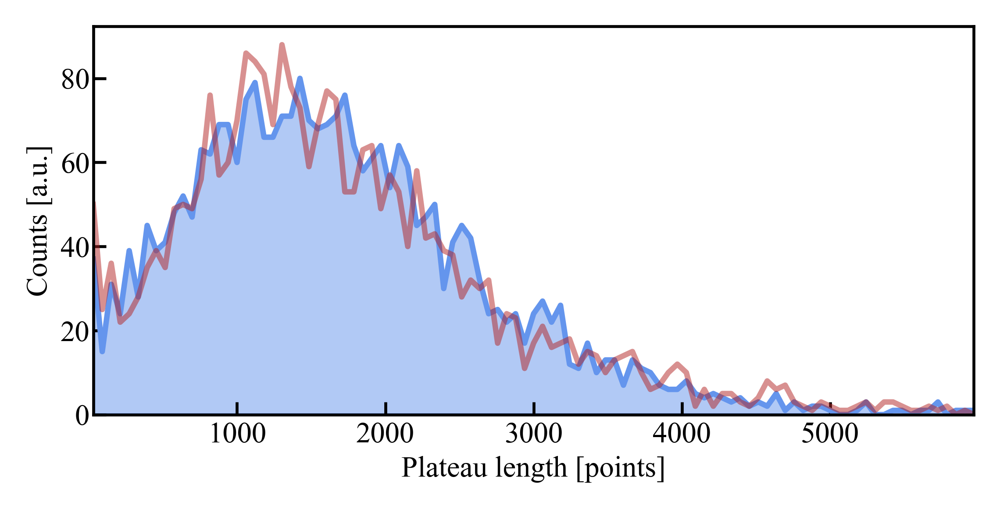

In [4]:
ax_temp_pull, ax_temp_push = hist_1.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_1.temporal_hist_pull.shape[0], num=9, endpoint=True))
ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_1.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_1.plot_hist_1d(ylims=(0, 150))
ax_pull, ax_push = hist_1.plot_hist_2d_both()
ax_plat = hist_1.plot_plateau_length_hist()

In [8]:
hist_1.calc_hist_2d(align_at=0.5, range_pull=(-0.5, 1), range_push=(-1, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/29 [00:00<?, ?it/s]

2D histogram pull direction created from 2826 traces
2D histogram push direction created from 2831 traces


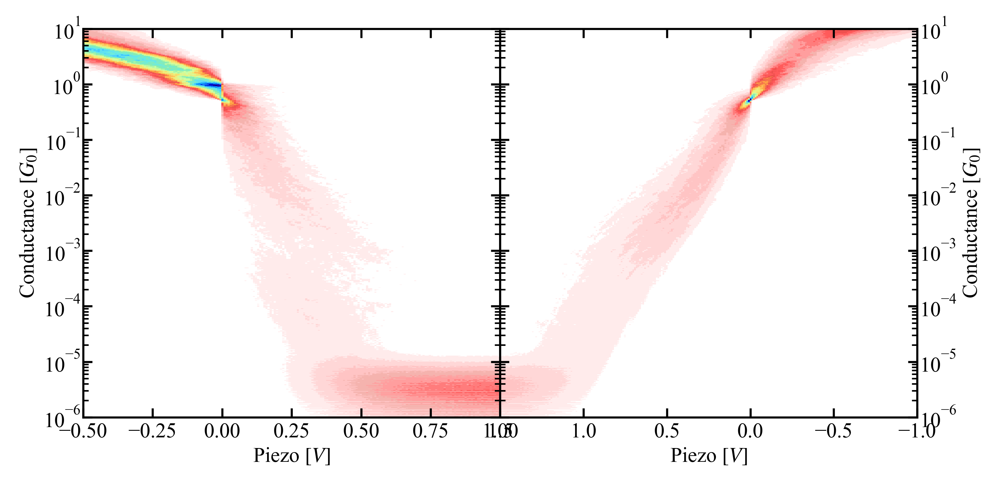

In [9]:
ax_pull, ax_push = hist_1.plot_hist_2d_both()

# Statistics for traces 3133-16100

**BJ Settings:**

|                   |           |
|-------------------|:-----------:|
| rate              |  $3$        |
| pull excursion    | $2$         |
| push excursion    | $2$         |
| $G_{\text{low}}$  | $10^{-5}$ |
| $G_{\text{high}}$ | $10$      |

In [10]:
hist_2 = Histogram(home_folder, start_trace=3133, end_trace=16100)

hist_2.calc_stats(align_at=1e-5, range_pull=(-1, 0.1), range_push=(-3, 1), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/131 [00:00<?, ?it/s]

Pull 2D histogram created from 12967 traces
Push 2D histogram created from 12968 traces


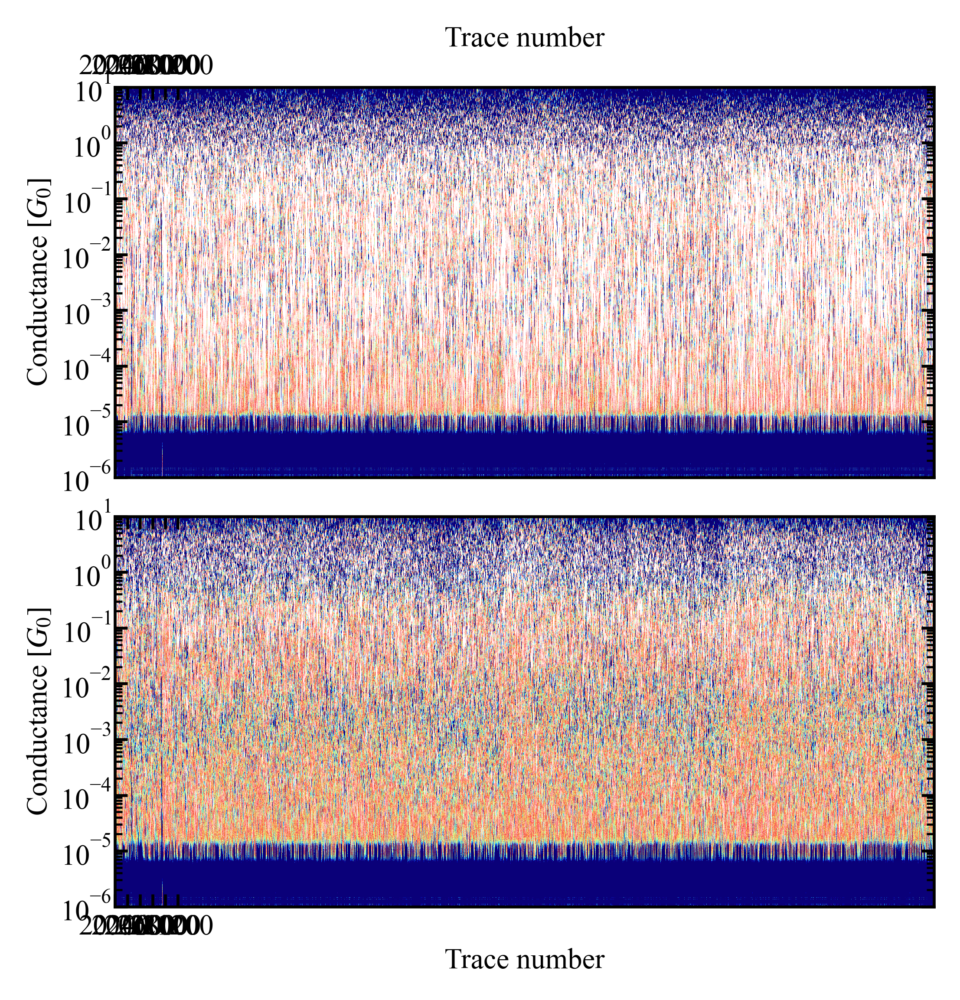

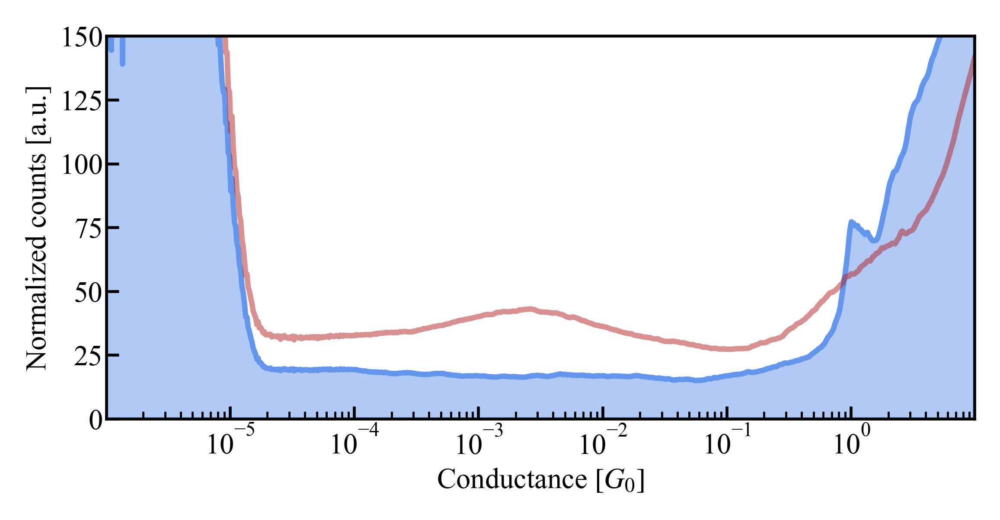

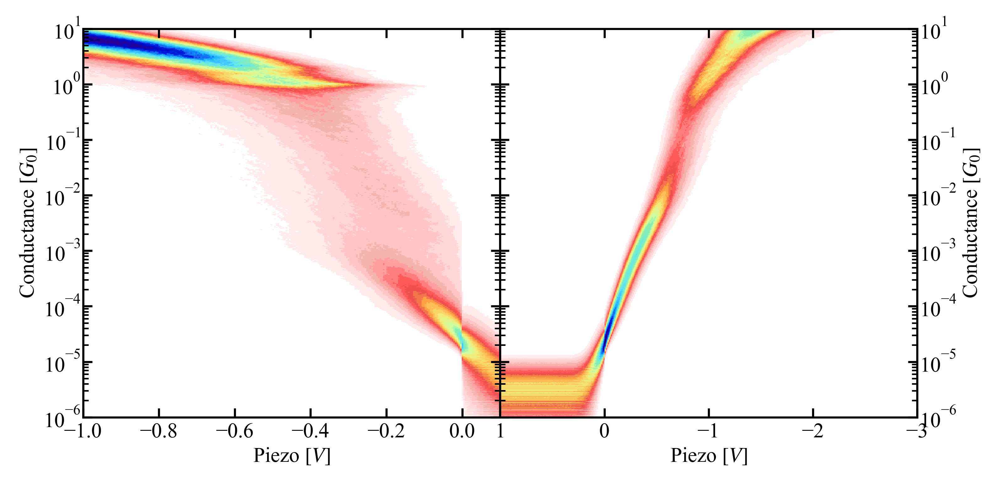

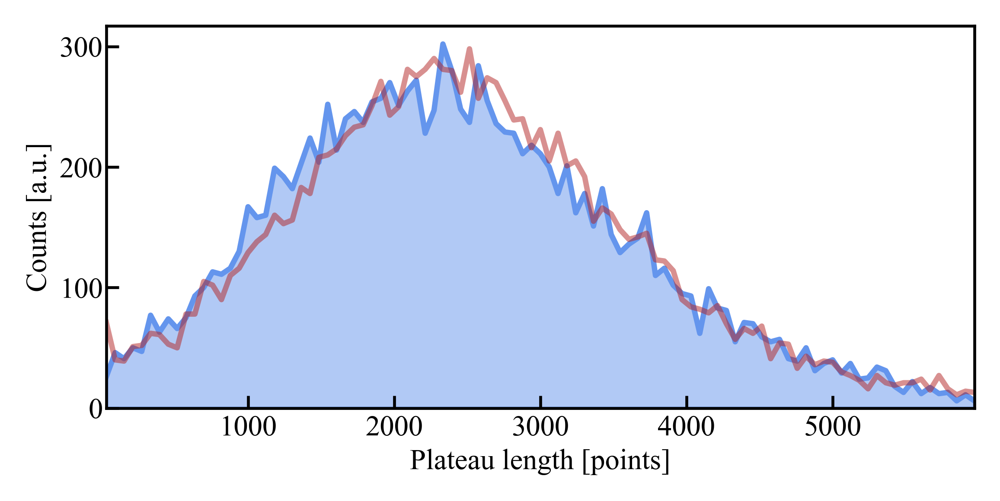

In [11]:
ax_temp_pull, ax_temp_push = hist_2.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(0, 1000, 6).astype(int))
ax_temp_pull.set_xticklabels(np.linspace(20200, 21200, 6).astype(int))
ax_temp_push.set_xticks(np.linspace(0, 1000, 6).astype(int))
ax_temp_push.set_xticklabels(np.linspace(20200, 21200, 6).astype(int))
ax_1d = hist_2.plot_hist_1d(ylims=(0, 150))
ax_pull, ax_push = hist_2.plot_hist_2d_both()
ax_plat = hist_2.plot_plateau_length_hist()

In [60]:
hist_2.calc_hist_2d(align_at=0.5, range_pull=(-0.1, 0.5), range_push=(-1, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/131 [00:00<?, ?it/s]

2D histogram pull direction created from 12967 traces
2D histogram push direction created from 12968 traces


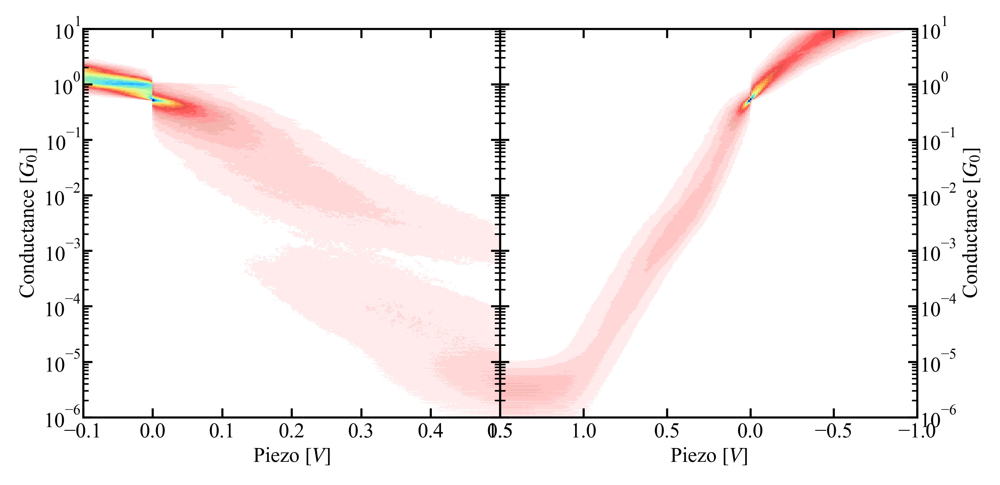

In [61]:
ax_pull, ax_push = hist_2.plot_hist_2d_both()

***

# I(V) measurements

## Details

**bias waveform**: *custom_IV_mcbj_with_wait.ini*

**IV bias range**: $\pm 1\;\text{V}$

added 500 ms long 100 mV wait in the beginning to account for relaxation

## 16101-49000    rate=3

### Filtering traces that did not break during the hold measurement

In [14]:
did_not_break_pull, did_not_break_push = filter_traces.filter_hold(home_folder,
                                                                   filter_condition=filter_traces.does_not_break_array,
                                                                   start_trace=16_101, end_trace=49_100,
                                                                   bias_offset=0, r_serial_ohm=100_000,
                                                                   min_step_len=20_000)

Filtering traces:   0%|          | 0/297 [00:00<?, ?it/s]

In [15]:
print('pull', len(did_not_break_pull))
print('push', len(did_not_break_push))

pull 12879
push 21335


### Filtering traces where the conductance on the two 200 mV bias plateaus do not differ more than a factor of 2

In [16]:
stable_pull, stable_push = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                                     start_trace=16_101, end_trace=49_100,
                                                     bias_offset=0, r_serial_ohm=100_000,
                                                     min_step_len=20_000, max_ratio=2, plateaus=(0, 2))

Filtering traces:   0%|          | 0/297 [00:00<?, ?it/s]

In [17]:
print('pull', len(stable_pull))
print('push', len(stable_push))

pull 9710
push 22193


In [18]:
pull_traces = np.intersect1d(did_not_break_pull, stable_pull)
push_traces = np.intersect1d(did_not_break_push, stable_push)

In [19]:
print(f'pull: {len(pull_traces)}, {len(pull_traces)/33_000*100}%')
print(f'push: {len(push_traces)}, {len(push_traces)/33_000*100}%')

pull: 8127, 24.62727272727273%
push: 21053, 63.7969696969697%


In [20]:
np.save(home_folder.joinpath('results/pull_filtered_traces.npy'), pull_traces)
np.save(home_folder.joinpath('results/push_filtered_traces.npy'), push_traces)

In [21]:
pull_traces = np.load(home_folder.joinpath('results/pull_filtered_traces.npy'))
push_traces = np.load(home_folder.joinpath('results/push_filtered_traces.npy'))

The amount of pull traces is not significant, so from now on focus on push traces.

We are interested in the I(V) curves where the up-down sweeps overlap nicely. The difference between the up-down sweeps is calculated with the function `filter_traces.iv_difference`

0.5121267851392495


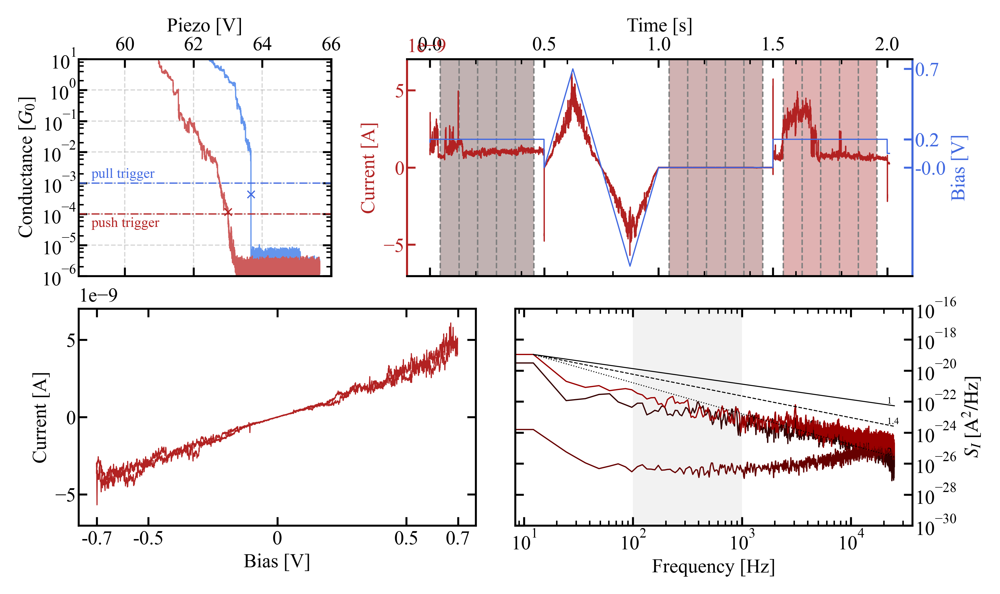

In [62]:
hold_trace = HoldTrace(push_traces[0],
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=0)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                         smoothing=10, which_psds=[0, 1, 2])

print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [41]:
push_diff = []
traces = []
for which_trace in tqdm(push_traces):
    try:
        hold_trace = HoldTrace(which_trace, load_from=home_folder, bias_offset=0,
                               r_serial_ohm=100_000, min_step_len=20_000, min_height=1, iv=0)
        push_diff.append(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))
        traces.append(hold_trace.trace_num)
    except MeasurementOverflow:
        continue
    
push_diff = np.array(push_diff)
traces = np.array(traces)

  0%|          | 0/21053 [00:00<?, ?it/s]

6219 30.425636007827787


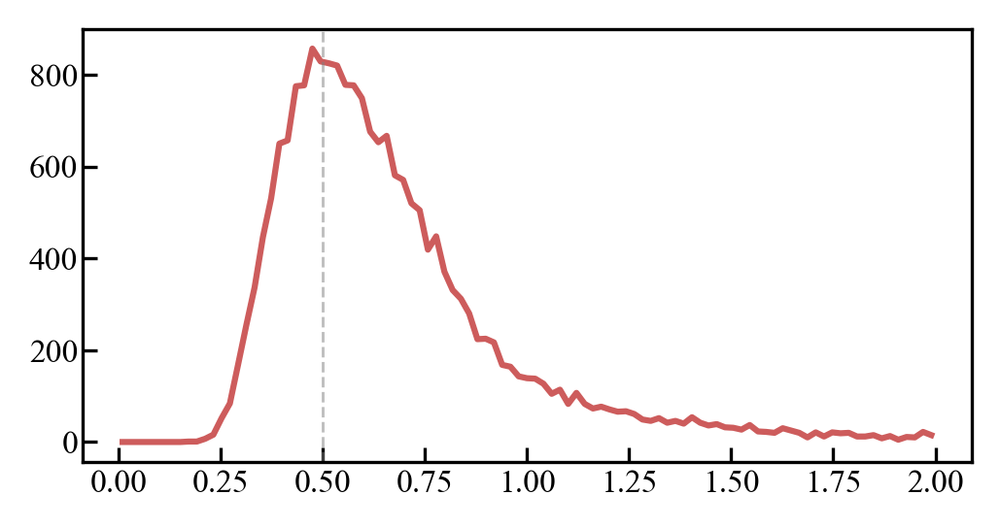

In [42]:
push_diff_bins, push_diff_hist = utils.calc_hist_1d_single(data=push_diff, xrange=(0, 2),
                                                           xbins_num=100, log_scale=False)

print(len(push_diff[push_diff < 0.5]), len(push_diff[push_diff < 0.5])/len(push_diff)*100)

fig, ax = plt.subplots(1, figsize=utils.cm2inch(10, 5), dpi=300)
ax.plot(push_diff_bins, push_diff_hist, 'indianred')
ax.axvline(0.5, c='grey', alpha=0.5, ls='--', lw=0.7)

In [43]:
selected_traces = traces[push_diff < 0.5]
np.save(home_folder.joinpath('results/push_selected_traces_IV.npy'), selected_traces)

In [44]:
selected_traces = np.load(home_folder.joinpath('results/push_selected_traces_IV.npy'))

Plotted trace: 31447
0.3955415171499891


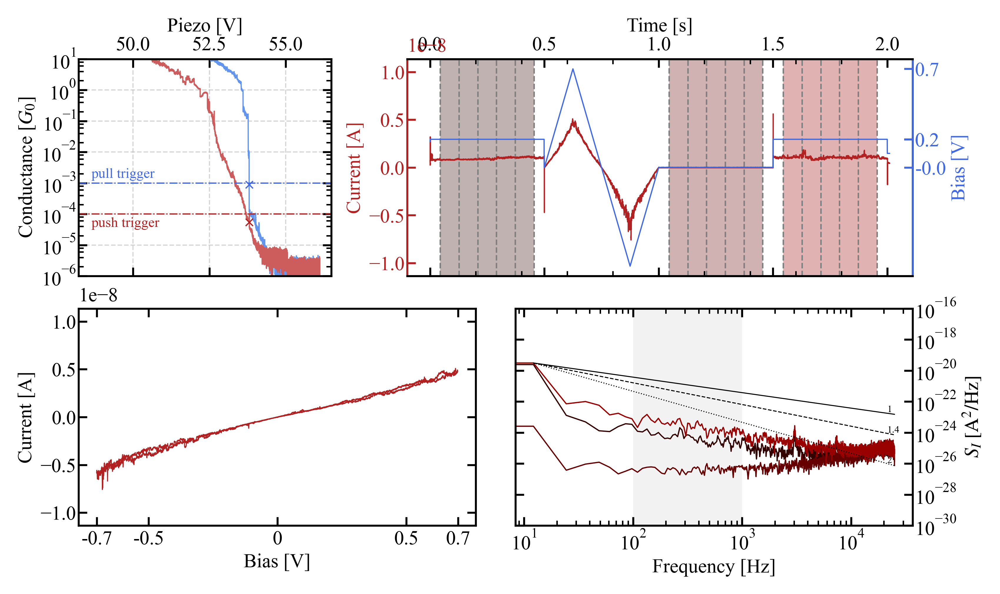

In [51]:
which_trace = np.random.choice(selected_traces)
# which_trace = 25359
print(f'Plotted trace: {which_trace}')

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=0)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)
plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', which_psds=[0, 1, 2],
                         smoothing=10)

print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [52]:
hold_trace.avg_cond_on_step_push

array([5.30614036e-05, 9.61414143e-05, 7.04201225e-05])

In [53]:
selected_traces.shape

(6219,)

***

### BJ tunnel linear fit

In [54]:
fit_params = []
fit_errors = []

for trace in tqdm(selected_traces):
    trace_pair = TracePair(trace, load_from=home_folder)
    popt, perr = trace_pair.fit_tunnel()
    
    fit_params.append(popt)
    fit_errors.append(perr)
    
fit_params = np.array(fit_params)
fit_errors = np.array(fit_errors)

  0%|          | 0/6219 [00:00<?, ?it/s]

In [55]:
tunnel_slope_2_df = pd.DataFrame({'trace': selected_traces,
                                  'slope': fit_params[:, 0], 
                                  'slope error': fit_errors[:, 0],
                                  'intercept': fit_params[:, 1],
                                  'intercept_error': fit_errors[:, 1]
                                 })

tunnel_slope_2_df.to_csv(home_folder.joinpath('results/IVs/IV_fit/fit_tunnel.csv'), index=False)

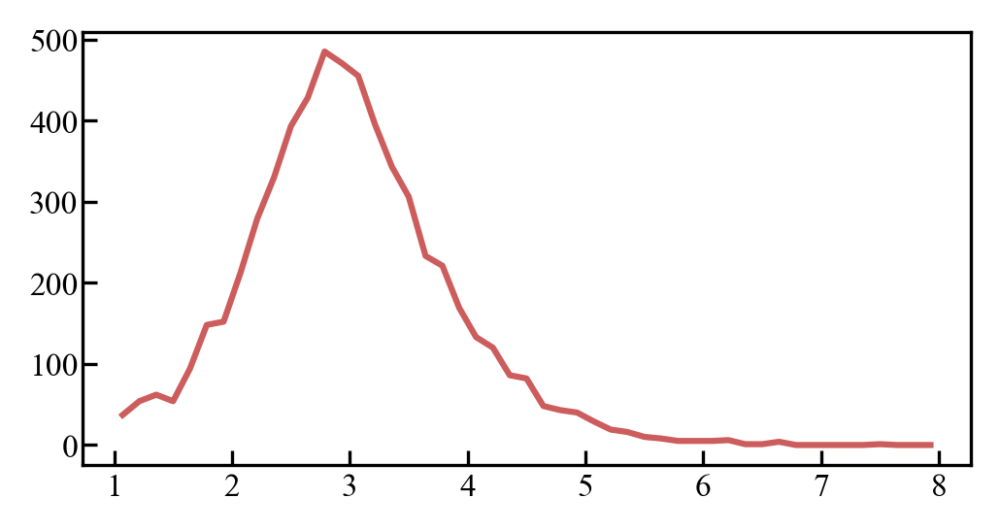

In [56]:
fit_params_bins, fit_params_hist = utils.calc_hist_1d_single(data=fit_params[:, 0], xrange=(1, 8),
                                                             xbins_num=50, log_scale=False)


fig, ax = plt.subplots(1, figsize=utils.cm2inch(10, 5), dpi=300)
ax.plot(fit_params_bins, fit_params_hist, 'indianred')
# ax.axvline(0.5, c='grey', alpha=0.5, ls='--', lw=0.7)

### Save I(V) curves in Laci's format

In [58]:
for which_trace in tqdm(selected_traces):
    hold_trace = HoldTrace(which_trace,
                           load_from=home_folder, bias_offset=0,
                           r_serial_ohm=100_000, min_step_len=20_000, min_height=1, iv=0, gain=1e7)
    hold_trace.save_iv_for_laci(home_folder, direction='push')

  0%|          | 0/6219 [00:00<?, ?it/s]

***

### Histograms of selected traces

In [63]:
hist_filt = Histogram(home_folder, traces=selected_traces)

hist_filt.calc_stats(align_at=1e-5, range_pull=(-0.8, 0.55), range_push=(-3, 1), xbins_pull=250, xbins_push=400,
                     plateau_length_bins=100)

  0%|          | 0/6219 [00:00<?, ?it/s]

Pull 2D histogram created from 6219 traces
Push 2D histogram created from 6218 traces


In [64]:
tunnel_slope_df = pd.read_csv(home_folder.joinpath('results/IVs/IV_fit/fit_tunnel.csv'))

In [65]:
tunnel_slope_df.slope.mean()

2.9043196012317005

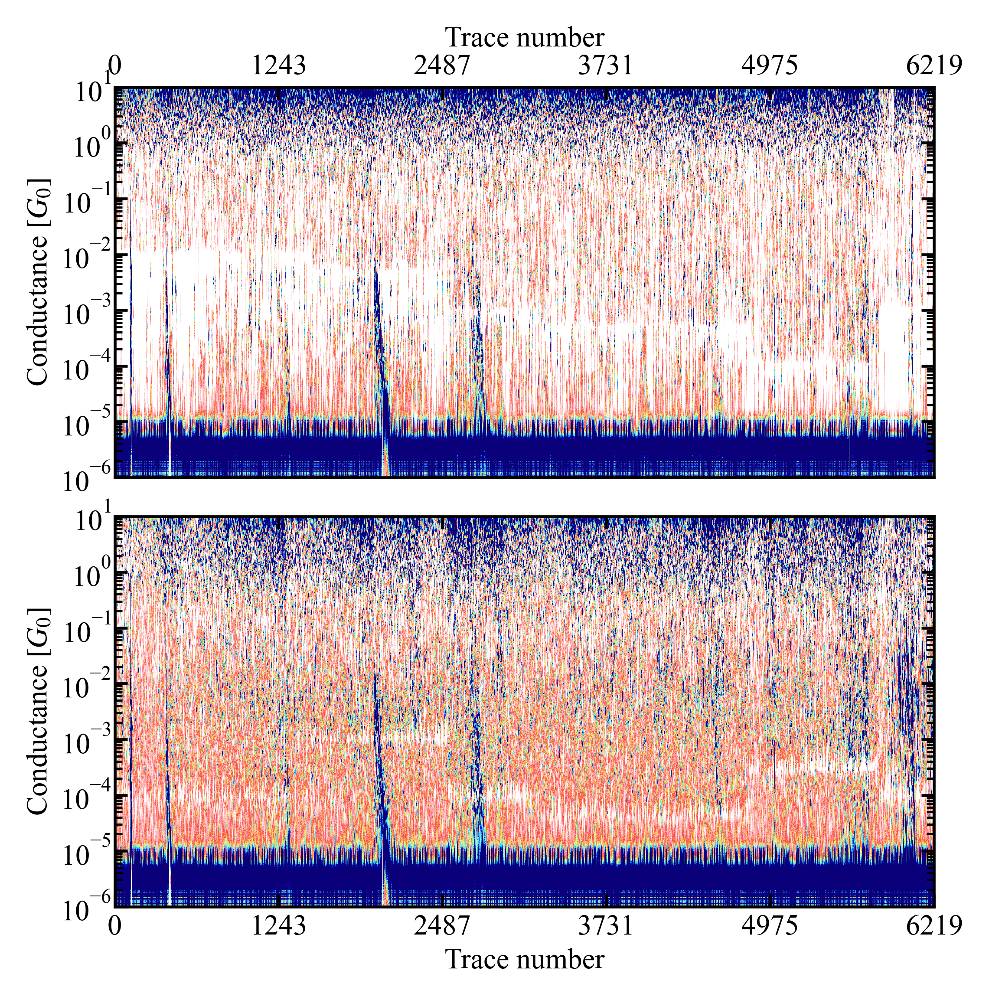

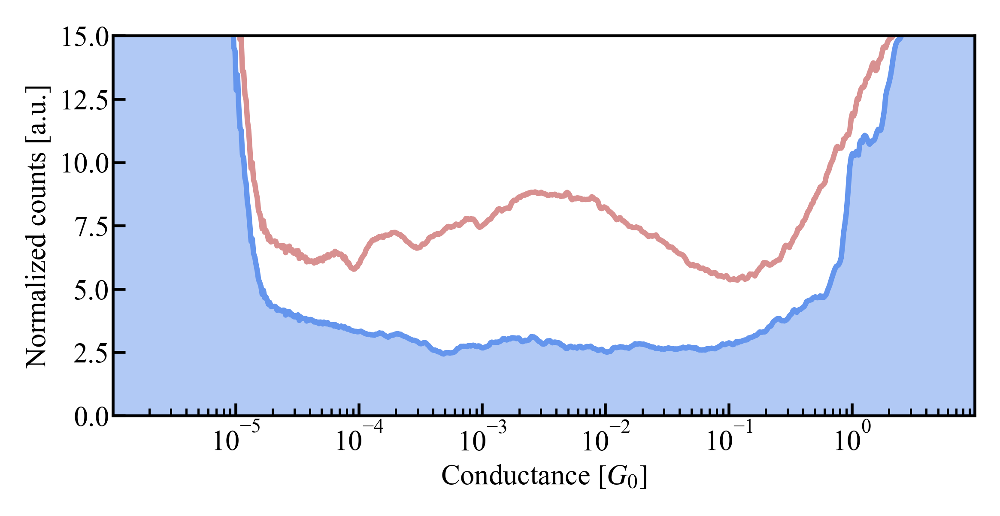

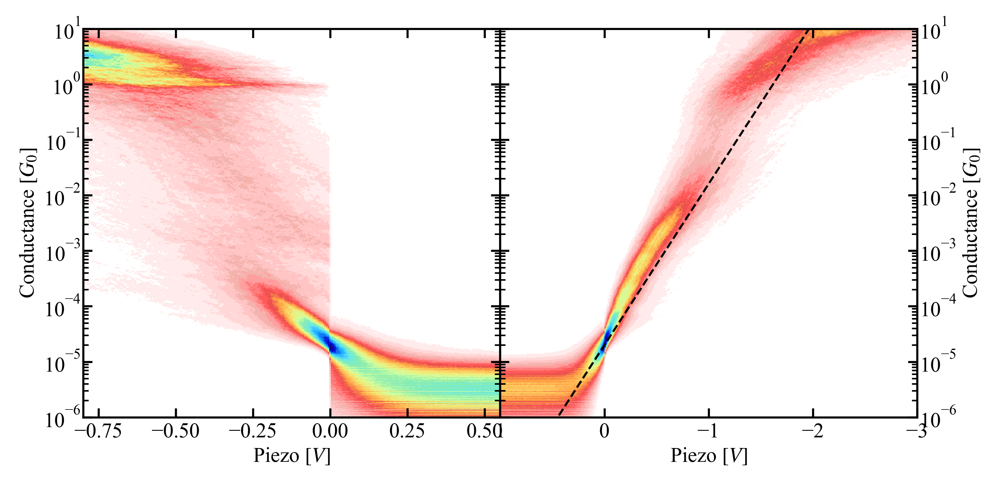

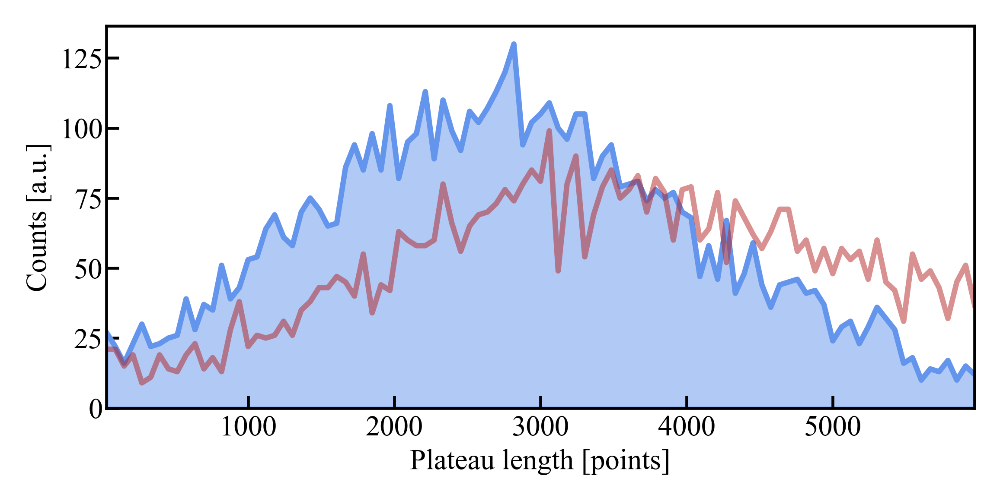

In [68]:
ax_temp_pull, ax_temp_push = hist_filt.plot_temporal_hist(vmax=200)
ax_temp_pull.set_xticks(np.linspace(0, len(selected_traces), 6).astype(int))
ax_temp_pull.set_xticklabels(np.linspace(0, len(selected_traces), 6).astype(int))
ax_temp_push.set_xticks(np.linspace(0, len(selected_traces), 6).astype(int))
ax_temp_push.set_xticklabels(np.linspace(0, len(selected_traces), 6).astype(int))
ax_1d = hist_filt.plot_hist_1d(ylims=(0, 15))
ax_pull, ax_push = hist_filt.plot_hist_2d_both()
ax_push.plot(np.arange(start=-3, stop=1, step=0.2),
             10**(-tunnel_slope_2_df.slope.mean()*np.arange(start=-3, stop=1, step=0.2)-4.7), ls='--', lw=0.8, c='k')
ax_plat = hist_filt.plot_plateau_length_hist()

***

### For those traces that did not break and were stable throughout the measurement an I(V) is good (6291 traces)

In [70]:
noise_stat = NoiseStats(home_folder, traces=selected_traces, num_of_fft=5, bias_offset=0,
                        min_step_len=20_000, min_height=1, subtract_bg=False, save_data=1)

Processing hold files:   0%|          | 0/228 [00:00<?, ?it/s]

Data saved.


In [71]:
noise_stat = NoiseStats(home_folder, traces=selected_traces, num_of_fft=5, bias_offset=0,
                        min_step_len=20_000, min_height=1, subtract_bg=True, save_data=2)

Processing hold files:   0%|          | 0/228 [00:00<?, ?it/s]

Data saved.


In [27]:
# pd.read_csv(home_folder.joinpath("results/noise_stats_push_2.csv")).head(1)

In [72]:
noise_stat_push = pd.read_csv(home_folder.joinpath("results/noise_stats_push_2.csv"), skiprows=[1])

In [29]:
# noise_stat_push.head()

#### After subtracting the background

#### First 200 mV plateau:

In [76]:
step=1

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

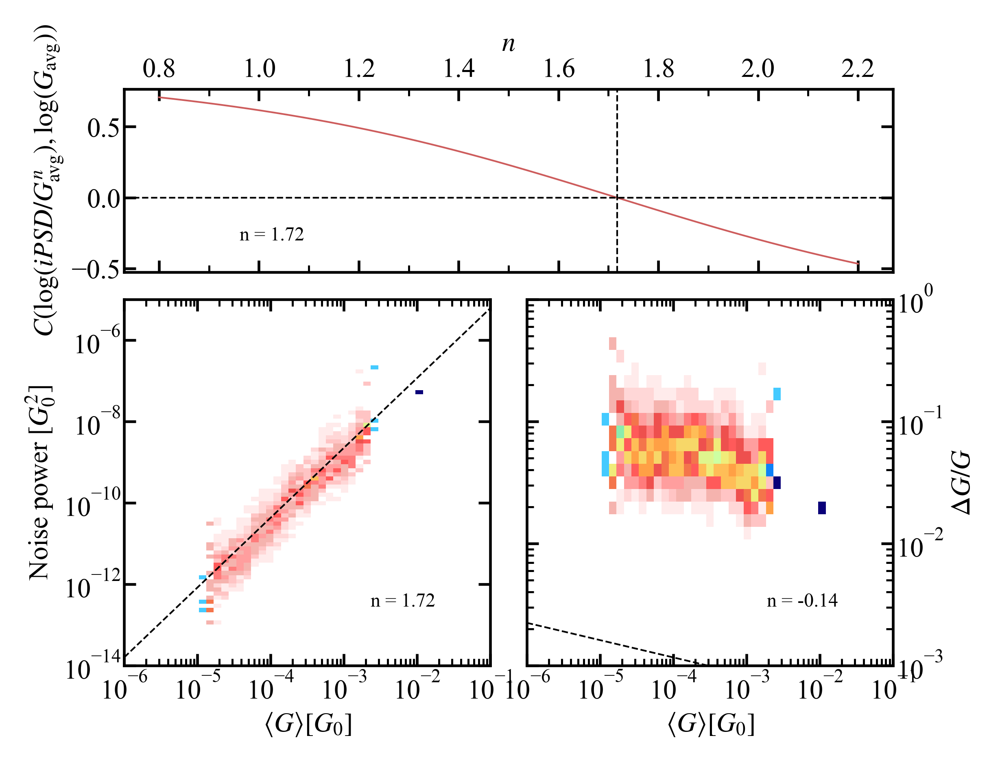

In [77]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

***

#### Second 200 mV plateau:

In [78]:
step=2

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

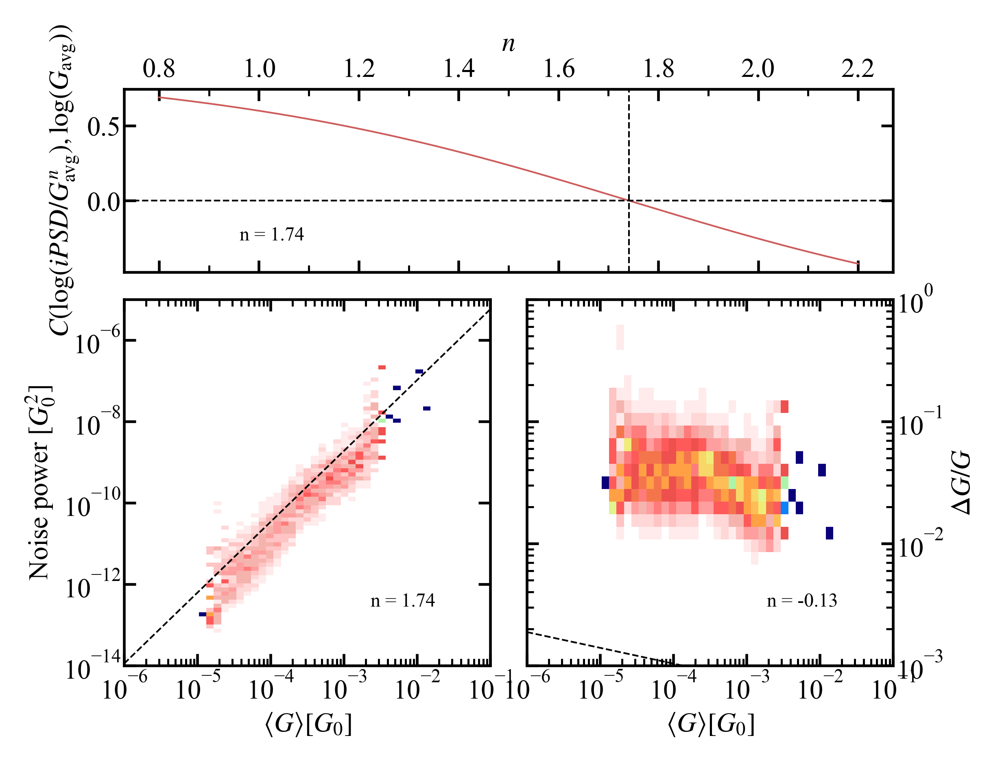

In [79]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

***

### For all traces that did not break and were stable throughout the measurement (21053 traces)

In [34]:
noise_stat = NoiseStats(home_folder, traces=push_traces, num_of_fft=5, bias_offset=0,
                        min_step_len=20_000, min_height=1, subtract_bg=False, save_data=3)

Processing hold files:   0%|          | 0/34 [00:00<?, ?it/s]

Data saved.
During the analysis the following errors occurred:
Overflow at trace_25254


In [81]:
noise_stat = NoiseStats(home_folder, traces=push_traces, num_of_fft=5, bias_offset=0,
                        min_step_len=20_000, min_height=1, subtract_bg=True, save_data=4)

Processing hold files:   0%|          | 0/233 [00:00<?, ?it/s]

Data saved.
During the analysis the following errors occurred:
Overflow at trace_23659
Overflow at trace_37500


#### After subtracting the background

#### First 200 mV plateau:

In [83]:
noise_stat_push = pd.read_csv(home_folder.joinpath("results/noise_stats_push_4.csv"), skiprows=[1])

In [87]:
step=1

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

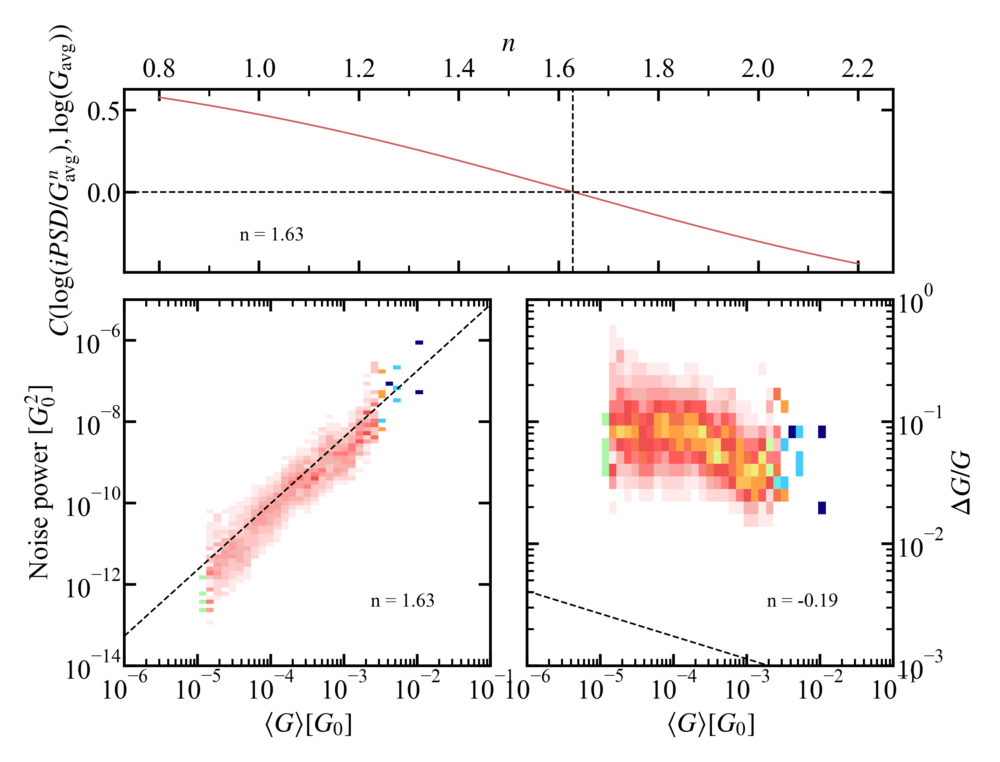

In [88]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

***

#### Second 200 mV plateau:

In [89]:
step=2

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

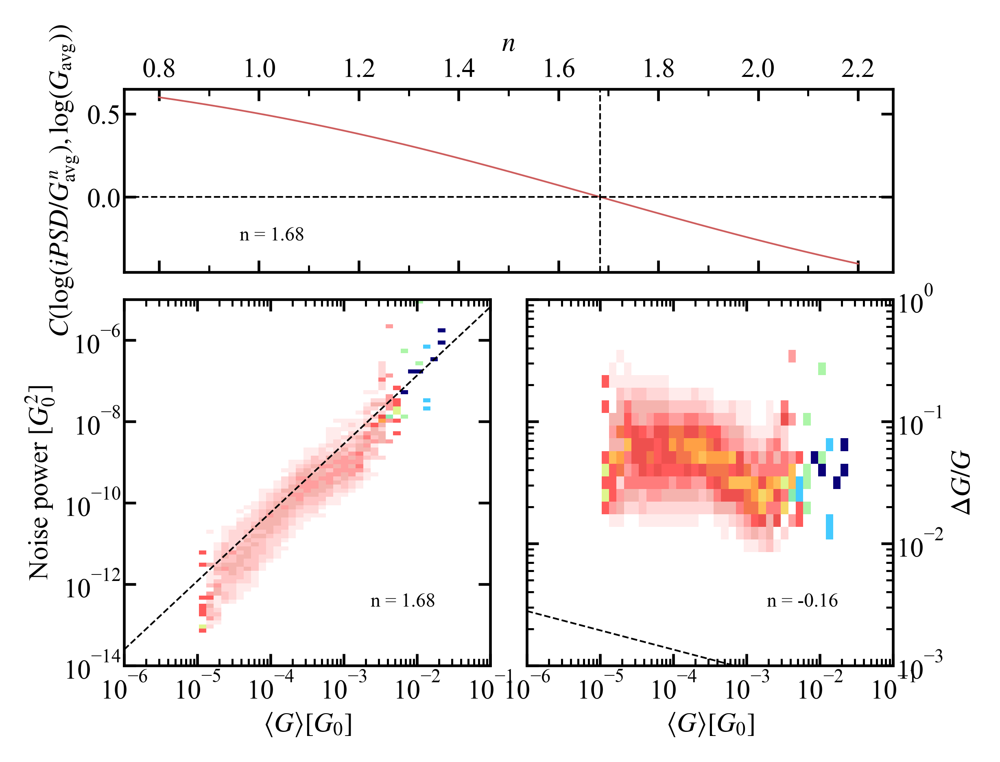

In [90]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)